# 1. Getting Started: Airbnb Copenhagen

This assignment deals with the most recent Airbnb listings in Copenhagen. The data is collected from [Inside Airbnb](http://insideairbnb.com/copenhagen). Feel free to explore the website further in order to better understand the data. The data (*listings.csv*) has been collected as raw data and needs to be preprocessed.

**Hand-in:** Hand in as a group in Itslearning in a **single**, well-organized and easy-to-read Jupyter Notebook. Please just use this notebook to complete the assignment.

If your group consists of students from different classes, upload in **both** classes.

The first cell does some preprocessing. Please just run these cells and do not change anything. The assignment starts below. Make sure that listings.csv' is in the same folder as this notebook




<>:55: SyntaxWarning: invalid escape sequence '\$'
<>:55: SyntaxWarning: invalid escape sequence '\$'
C:\Users\Dotev\AppData\Local\Temp\ipykernel_5804\1842324635.py:55: SyntaxWarning: invalid escape sequence '\$'
  data_filtered['price'] = data_filtered['price'].replace('[\$,]', '', regex=True).astype(float)


,id,name,host_id,host_name,neighbourhood_cleansed,latitude,longitude,room_type,price,minimum_nights,...,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month,calculated_host_listings_count,availability_365,price_category
0,6983,Copenhagen 'N Livin',16774,Simon,Nørrebro,55.686410,12.547410,Entire home/apt,898.0,3,...,4.79,4.78,4.86,4.89,4.73,4.71,1.08,1,0,0
1,26057,Lovely house - most attractive area,109777,Kari,Indre By,55.693070,12.576490,Entire home/apt,2600.0,4,...,4.93,4.96,4.93,4.86,4.94,4.81,0.55,1,303,1
2,26473,City Centre Townhouse Sleeps 1-10 persons,112210,Julia,Indre By,55.676020,12.575400,Entire home/apt,3250.0,3,...,4.63,4.44,4.78,4.70,4.89,4.59,2.06,3,56,1
3,29118,Best Location in Cool Istedgade,125230,Nana,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,725.0,7,...,4.87,4.73,5.00,5.00,4.87,4.80,0.16,1,59,0
4,31094,"Beautiful, spacious, central, renovated Penthouse",129976,Ebbe,Vesterbro-Kongens Enghave,55.666602,12.555283,Entire home/apt,1954.0,3,...,4.82,4.88,4.87,4.82,4.80,4.53,0.13,1,0,1


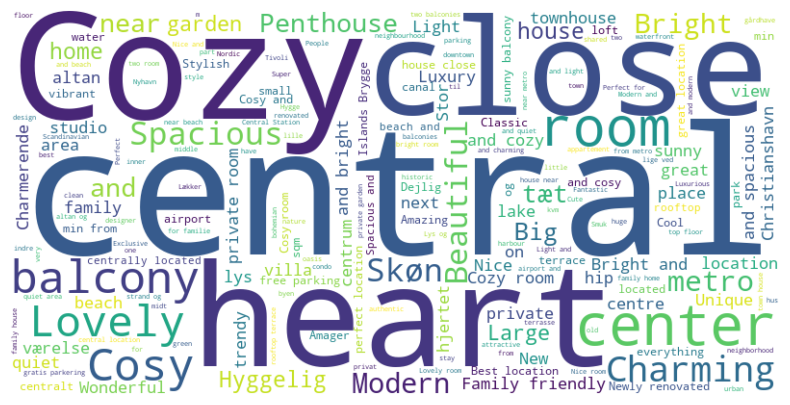

In [23]:
# pip install pandas
# pip install scikit-learn
import pandas as pd
import sklearn as sk

# load the data
data = pd.read_csv('listings.csv')

# filter relevant columns
data_limited = data[["id",
    "name",
    "host_id"  ,
    "host_name" , 
    "neighbourhood_cleansed"  ,
    "latitude"  ,
    "longitude"  ,
    "room_type"  ,
    "price"  ,
    "minimum_nights"  ,
    "number_of_reviews",  
    "last_review"  ,
    "review_scores_rating"  ,
    "review_scores_accuracy" , 
    "review_scores_cleanliness"  ,
    "review_scores_checkin"  ,
    "review_scores_communication"  ,
    "review_scores_location"  ,
    "review_scores_value"  ,
    "reviews_per_month"  ,
    "calculated_host_listings_count"  ,
    "availability_365",]]

# removing rows with no reviews

data_filtered = data_limited.loc[data_limited['number_of_reviews'] != 0]

# remove nan

data_filtered = data_filtered.dropna()
data_filtered.head()

# get a list of distinct values from neighbourhood_cleansed columns in data_filtered

neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# replace e.g. Nrrbro with Nørrebro in neighbourhood_cleansed column

data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Nrrebro", "Nørrebro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("sterbro", "Østerbro")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Vanlse", "Vanløse")
data_filtered["neighbourhood_cleansed"] = data_filtered["neighbourhood_cleansed"].replace("Brnshj-Husum", "Brønshøj-Husum")
neighbourhoods = data_filtered["neighbourhood_cleansed"].unique()

# Remove dollar signs and commas and convert to float - note the prices are actually in DKK
data_filtered['price'] = data_filtered['price'].replace('[\$,]', '', regex=True).astype(float)

# Calculate the median price
median_price = data_filtered['price'].median()

# Create a new column 'price_category' with 0 for 'affordable' and 1 for 'expensive'
data_filtered['price_category'] = (data_filtered['price'] > median_price).astype(int)

display(data_filtered.head())

# Describe the apartments using a wordcloud
# Remember to install packages
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine the two lists of stop words
stop_words = ['Østerbro', 'Copenhagen', 'København', 'in', 'bedroom', 'bedrooms', 'bed', 'beds', 'bath', 'baths', 'Frederiksberg', 'V', 'Ø', 'SV', 'S', 'N', 'K', 'C', 'W', 'kbh', 'Ballerup', 'Hellerup', 'Valby', 'Vanløse', 'Brønhøj', 'Nørrebro', 'Vesterbro', "CPH", "with", "to", "of", "a", "the", "på", "i", "med", "af", "at", "city", "by", "apartment", "appartment", "lejlighed", "flat", "m2", "apt"]

# Convert the 'name' column to a single string
text = ' '.join(data_filtered['name'].astype(str))

# Create and generate a word cloud image
wordcloud = WordCloud(stopwords=stop_words, background_color="white", width=800, height=400).generate(text)

# Display the generated word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

## Your tasks start here

**Importing some necessary packages**

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium
from folium.plugins import MarkerCluster


### 1. Since data science is so much fun, provide a word cloud of the names of the hosts, removing any names of non-persons. Does this more or less correspond with the distribution of names according to [Danmarks Statistik](https://www.dst.dk/da/Statistik/emner/borgere/navne/navne-i-hele-befolkningen)?

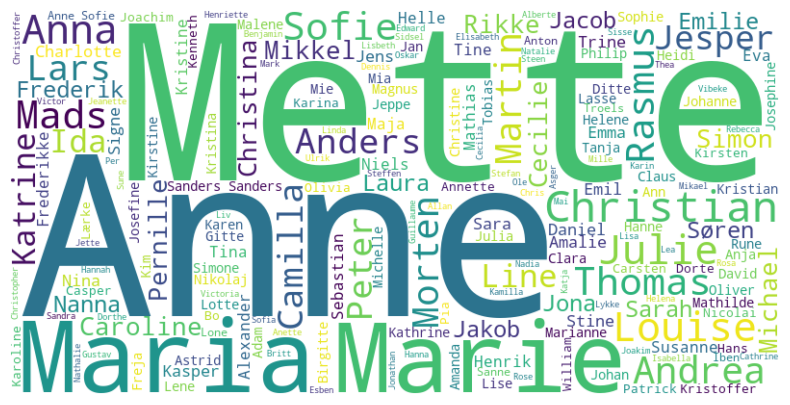

In [25]:
stop_words = ['ApartmentinCopenhagen', 'Og', 'Forenom', 'Denmark', 'Blueground', 'Rent', 'A', 'And', 'Into', 'This', 'Place']

# Convert the 'host_name' column to a single string
text = ' '.join(data_filtered['host_name'].astype(str))

# Create and generate a word cloud image
wordcloud = WordCloud(stopwords=stop_words, background_color="white", width=800, height=400).generate(text)

# Display the generated word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

### 2. Using non-scaled versions of latitude and longitude, plot the listings data on a map.

In [26]:

# Get the mean of the latitude and longitude so the map can be centered when loaded
mean_lat = data_filtered['latitude'].mean()
mean_lng = data_filtered['longitude'].mean()
map = folium.Map(location=[mean_lat, mean_lng], zoom_start=12)

# Create a MarkerCluster object to be less resource intensive
marker_cluster = MarkerCluster().add_to(map)

# Add the markers to the cluster
for _, row in data_filtered.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']], 
        popup=row['name']
    ).add_to(marker_cluster)

# Display the map
map

### 3. Create boxplots where you have the neighbourhood on the x-axis and price on the y-axis. What does this tell you about the listings in Copenhagen? Keep the x-axis as is and move different variables into the y-axis to see how things are distributed between the neighborhoods to create different plots (your choice).

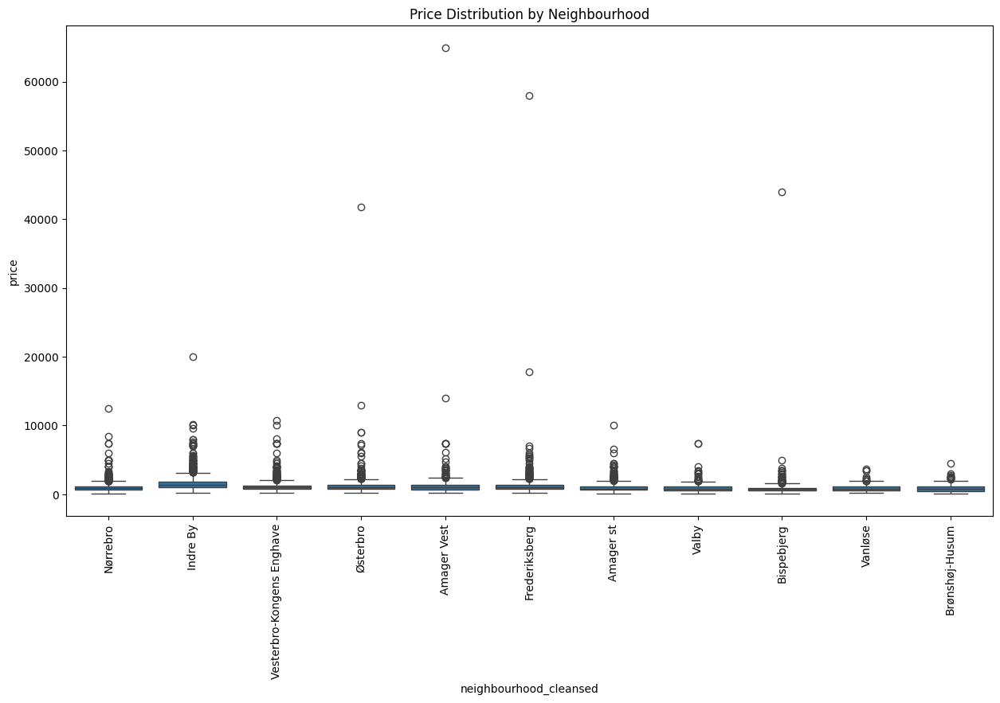

In [27]:

plt.figure(figsize=(15, 8))
sns.boxplot(x='neighbourhood_cleansed', y='price', data=data_filtered)
plt.title('Price Distribution by Neighbourhood')
plt.xticks(rotation=90)
plt.show()

Here can be seen that the outliers and uneven distribution are interfering with spotting insights. Because of that in the next code snippet the price data will be log transformed so the skewness and the influence of the outliers is reduced.

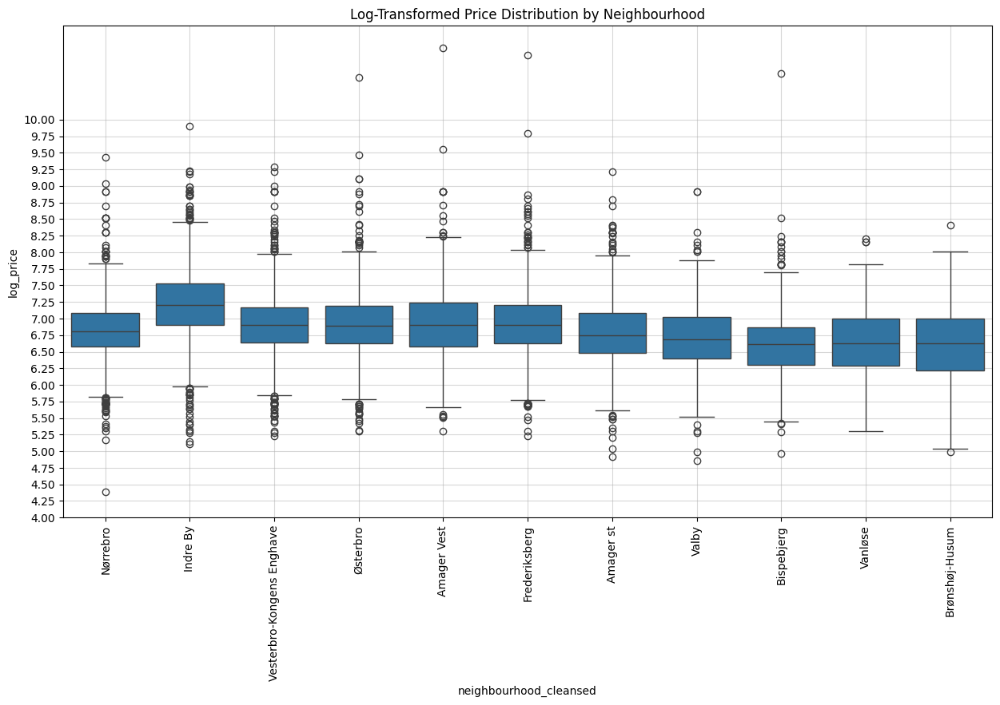

In [28]:
# Apply log transformation to the price data (using log1p to avoid log(0))
data_filtered['log_price'] = np.log1p(data_filtered['price'])

# Plot the boxplot with the log-transformed price
plt.figure(figsize=(15, 8))
sns.boxplot(x='neighbourhood_cleansed', y='log_price', data=data_filtered)
plt.title('Log-Transformed Price Distribution by Neighbourhood')
plt.xticks(rotation=90)

# Customize the y-axis ticks
y_ticks = np.arange(4, 10.25, 0.25)
plt.yticks(y_ticks)

plt.grid(True, alpha=0.5)

plt.show()

As we can see the neighbourhoods on the left has higher median price than the ones on the right. Probably because they are nearer to the city center. Indre By has the highest median price in comparison with the others. It can be also seen that a lot of neighbourhoods have big outliers which can mean that there is some properties that cost more for some other reason.


Indre By and Frederiksberg are more expensive neighborhoods with wider price variations.

Brønshøj-Husum and Valby are more affordable with consistent pricing.

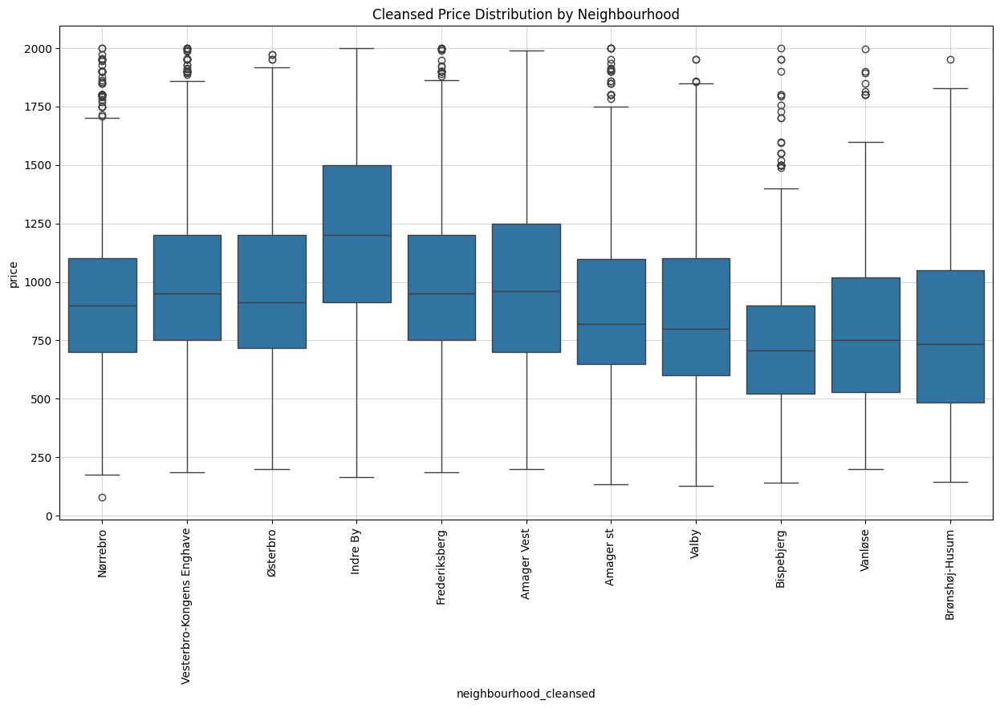

In [29]:
plt.figure(figsize=(15, 8))
sns.boxplot(x='neighbourhood_cleansed', y='price', data=data_filtered[data_filtered['price'] < 2000])
plt.title('Cleansed Price Distribution by Neighbourhood')
plt.xticks(rotation=90)

plt.grid(True, alpha=0.5)

plt.show()

Removing the prices above 2000 kr helps for better visualization of the boxplot

### 4. Do a descriptive analysis of the neighborhoods. Include information about room type in the analysis as well as one other self-chosen feature. The descriptive analysis should contain mean/average, mode, median, standard deviation/variance, minimum, maximum and quartiles.

In [30]:
# Group by 'neighbourhood_cleansed'
grouped = data_filtered.groupby('neighbourhood_cleansed')

grouped['price'].describe()

,count,mean,std,min,25%,50%,75%,max
neighbourhood_cleansed,,,,,,,,
Amager Vest,1059.0,1205.754485,2121.656424,200.0,722.00,1000.0,1400.00,64900.0
Amager st,924.0,1019.860390,704.769611,135.0,650.00,851.0,1190.00,10000.0
Bispebjerg,604.0,912.066225,1831.810612,143.0,542.25,747.5,961.00,44000.0
Brønshøj-Husum,285.0,875.487719,552.009744,145.0,500.00,750.0,1100.00,4462.0
Frederiksberg,1177.0,1216.676296,1866.619993,185.0,750.00,1000.0,1339.00,58000.0
Indre By,1844.0,1570.907267,1065.975980,165.0,995.00,1350.0,1870.50,20000.0
Nørrebro,2057.0,1014.792902,609.390458,79.0,720.00,900.0,1199.00,12500.0
Valby,539.0,932.137291,622.836251,127.0,600.00,800.0,1119.50,7429.0
Vanløse,298.0,874.543624,502.561017,200.0,536.75,750.5,1091.75,3643.0


Observations

1. Indre By (mean = 1570.91) and Frederiksberg (mean = 1216.68) are the most expensive neighborhoods, with a wide range of prices.
2. Nørrebro has the highest number of listings (2057), with a median price of 900.This means that the neighbourhood offers more affordable prices.
3. Vanløse has the lowest average price (mean = 874.54) and tight price range, making it the most budget-friendly neighborhood.
4. Amager Vest shows extreme price variability with a max listing of 64,900, which probably are outliers that should be removed to not influence the models.
5. Brønshøj-Husum has a lower standard deviation (552.00), offering more stable pricing.

In [31]:
grouped["room_type"].describe()

,count,unique,top,freq
neighbourhood_cleansed,,,,
Amager Vest,1059,3,Entire home/apt,909
Amager st,924,4,Entire home/apt,791
Bispebjerg,604,3,Entire home/apt,508
Brønshøj-Husum,285,3,Entire home/apt,216
Frederiksberg,1177,2,Entire home/apt,1044
Indre By,1844,4,Entire home/apt,1702
Nørrebro,2057,3,Entire home/apt,1889
Valby,539,2,Entire home/apt,450
Vanløse,298,2,Entire home/apt,254


Observations

1. Amager st and Indre By has the most varying type of rooms.
2. For every neighbourhood the top offered room type is "Entire home/apt"
3. Brønshøj-Husum and Vanløse have fewer overall listings, indicating smaller or more niche rental markets.

### 5. Based on self-chosen features, develop three different regression models that can predict the price of a rental property. Remember to divide your data into training data and test data. Comment on your findings.

In [32]:
data_encoded = pd.get_dummies(data_filtered['neighbourhood_cleansed'], columns=['neighbourhood_cleansed'], drop_first=True)

data_filtered_encoded = pd.concat([data_filtered, data_encoded], axis=1)

Here we can see which features influence the price the most.

In [33]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model import Ridge, Lasso, ElasticNet
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score

features = ['latitude', 'longitude', 'price_category', 'availability_365'] + list(data_encoded.columns)
target = ['price']

X = data_filtered_encoded[features]
y = data_filtered_encoded[target]

X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_val_scaled = scaler.transform(X_val)

ridge_model = Ridge(alpha=1.0, random_state=42)
lasso_model = Lasso(alpha=0.1, random_state=42)
elastic_model = ElasticNet(random_state=42)

ridge_model.fit(X_train_scaled, y_train)
lasso_model.fit(X_train_scaled, y_train)
elastic_model.fit(X_train_scaled, y_train)

ridge_val_pred = ridge_model.predict(X_val_scaled)
lasso_val_pred = lasso_model.predict(X_val_scaled)
elastic_val_pred = elastic_model.predict(X_val_scaled)

decimals_after = 5

print("R² for Ridge Regression: {}".format(r2_score(y_val, ridge_val_pred)))
print("R² for Lasso Regression: {}".format(r2_score(y_val, lasso_val_pred)))
print("R² for Elastic Net Regression: {}".format(r2_score(y_val, elastic_val_pred)))

print("MSE for Ridge Regression: {}".format(mean_squared_error(y_val, ridge_val_pred)))
print("MSE for Lasso Regression: {}".format(mean_squared_error(y_val, lasso_val_pred)))
print("MSE for Elastic Net Regression: {}".format(mean_squared_error(y_val, elastic_val_pred)))


R² for Ridge Regression: 0.08326684861372069
R² for Lasso Regression: 0.08326549523350812
R² for Elastic Net Regression: 0.07180800009720834
MSE for Ridge Regression: 2968657.6920509045
MSE for Lasso Regression: 2968662.074703121
MSE for Elastic Net Regression: 3005764.8903006343


The results above are very dissatisfying.
This could be because of the outliers. Most of the prices are below 20 000 kr. , only 5 above that price. So a solution could be to remove the outliers above that price. 

In [34]:
data_filtered_encoded = data_filtered_encoded[data_filtered_encoded['price'] < 2000]

X = data_filtered_encoded[features]
y = data_filtered_encoded[target]
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_val_scaled = scaler.transform(X_val)

ridge_model = Ridge(alpha=1.0, random_state=42)
lasso_model = Lasso(alpha=0.1, random_state=42)
elastic_model = ElasticNet(random_state=42)

ridge_model.fit(X_train_scaled, y_train)
lasso_model.fit(X_train_scaled, y_train)
elastic_model.fit(X_train_scaled, y_train)

ridge_val_pred = ridge_model.predict(X_val_scaled)
lasso_val_pred = lasso_model.predict(X_val_scaled)
elastic_val_pred = elastic_model.predict(X_val_scaled)

print("R² for Ridge Regression: {}".format(r2_score(y_val, ridge_val_pred)))
print("R² for Lasso Regression: {}".format(r2_score(y_val, lasso_val_pred)))
print("R² for Elastic Net Regression: {}".format(r2_score(y_val, elastic_val_pred)))

print("MSE for Ridge Regression: {}".format(mean_squared_error(y_val, ridge_val_pred)))
print("MSE for Lasso Regression: {}".format(mean_squared_error(y_val, lasso_val_pred)))
print("MSE for Elastic Net Regression: {}".format(mean_squared_error(y_val, elastic_val_pred)))


R² for Ridge Regression: 0.6594764954595924
R² for Lasso Regression: 0.6594699018083843
R² for Elastic Net Regression: 0.584283716487058
MSE for Ridge Regression: 52184.64442074287
MSE for Lasso Regression: 52185.6548865085
MSE for Elastic Net Regression: 63707.80914026841


It seems like the models now perform a lot better than before. It is time to try it on the test data.

In [35]:
ridge_test_pred = ridge_model.predict(X_test_scaled)
lasso_test_pred = lasso_model.predict(X_test_scaled)
elastic_test_pred = elastic_model.predict(X_test_scaled)

print("R² for Ridge Regression: {}".format(r2_score(y_test, ridge_test_pred)))
print("R² for Lasso Regression: {}".format(r2_score(y_test, lasso_test_pred)))
print("R² for Elastic Net Regression: {}".format(r2_score(y_test, elastic_test_pred)))

print("MSE for Ridge Regression: {}".format(mean_squared_error(y_test, ridge_test_pred)))
print("MSE for Lasso Regression: {}".format(mean_squared_error(y_test, lasso_test_pred)))
print("MSE for Elastic Net Regression: {}".format(mean_squared_error(y_test, elastic_test_pred)))


R² for Ridge Regression: 0.6560359362649474
R² for Lasso Regression: 0.65597567530932
R² for Elastic Net Regression: 0.5881692720145271
MSE for Ridge Regression: 49681.682686880886
MSE for Lasso Regression: 49690.386694047724
MSE for Elastic Net Regression: 59484.24764582853


The final result is very similar to the result form the validation set. The best model here is the Ridge Regression. 